In [ ]:
"""
FINAL DISSERTATION SCRIPT: From Stars to Sentiment - Demystifying Amazon Reviews
Author: Shoaib Farid Shaikh
Student ID: 20035142
Dublin Business School - Masters in Business Analytics

"""

# =====================================================
# SETUP: Dependencies and Google Drive Mount
# =====================================================

!pip -q install transformers scikit-learn imbalanced-learn pandas numpy torch matplotlib seaborn tqdm statsmodels scipy wordcloud shap tensorflow==2.15.0

# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

import os, re, math, random, json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
from collections import Counter
from wordcloud import WordCloud
from scipy.stats import pearsonr, spearmanr, chi2_contingency, mannwhitneyu

import shap
import torch
from transformers import AutoTokenizer, AutoModelForSequenceClassification

from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import (accuracy_score, precision_score, recall_score, f1_score,
                             roc_auc_score, confusion_matrix, classification_report)
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC

import statsmodels.api as sm
from scipy import sparse

import tensorflow as tf
from tensorflow.keras import layers, models

# Set plotting parameters for publication quality
plt.rcParams.update({
    "figure.dpi": 300,
    "axes.grid": True,
    "font.size": 10,
    "axes.titlesize": 12,
    "axes.labelsize": 10,
    "xtick.labelsize": 9,
    "ytick.labelsize": 9
})

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# =====================================================
# CONFIGURATION: Paths and Parameters
# =====================================================

# Data paths
DATASET_PATH = "/content/drive/MyDrive/Final dessertation code as proposal/amazon Dataset_Shoaib_20035142.csv"

# Output directories
BASE_OUTPUT_DIR = "/content/drive/MyDrive/Amazon Sentiment Analysis"
RQ_DIRS = {
    "RQ1": os.path.join(BASE_OUTPUT_DIR, "RQ1"),
    "RQ2": os.path.join(BASE_OUTPUT_DIR, "RQ2"),
    "RQ3": os.path.join(BASE_OUTPUT_DIR, "RQ3"),
    "RQ4": os.path.join(BASE_OUTPUT_DIR, "RQ4")
}
TABLES_DIR = os.path.join(BASE_OUTPUT_DIR, "tables")
TEXTS_DIR = os.path.join(BASE_OUTPUT_DIR, "texts")

# Create all directories
for directory in [BASE_OUTPUT_DIR, TABLES_DIR, TEXTS_DIR] + list(RQ_DIRS.values()):
    os.makedirs(directory, exist_ok=True)

print(" Environment setup complete. Output directories created.")


 Environment setup complete. Output directories created.


In [ ]:
# =====================================================
# DATA LOADING AND PREPROCESSING
# =====================================================

print("\n Loading and preprocessing data...")

# Load dataset
df = pd.read_csv(DATASET_PATH)
df.columns = df.columns.str.strip()
df.replace(r'^\s*$', np.nan, regex=True, inplace=True)

# Clean numerical columns
def to_num(s):
    s = str(s)
    s = re.sub(r'[₹,%]', '', s).replace(',', '')
    try:
        return float(s)
    except:
        return np.nan

num_cols = ['discounted_price', 'actual_price', 'discount_percentage', 'rating', 'rating_count']
for c in num_cols:
    if c in df.columns:
        df[c] = df[c].apply(to_num)

df[num_cols] = df[num_cols].fillna(0)

# Clean text columns
for c in ['category', 'review_title', 'review_content']:
    if c in df.columns:
        df[c] = df[c].fillna('').astype(str).str.strip()

if 'origindex' not in df.columns:
    df['origindex'] = np.arange(len(df))

print(f" Data loaded and cleaned: {df.shape[0]} rows x {df.shape[1]} cols")


 Loading and preprocessing data...
 Data loaded and cleaned: 21968 rows x 9 cols


In [ ]:
# =====================================================
# SENTIMENT EXTRACTION: RoBERTa Model
# =====================================================

print("\n Extracting sentiment using RoBERTa...")

roberta_name = "cardiffnlp/twitter-roberta-base-sentiment-latest"
device = "cuda" if torch.cuda.is_available() else "cpu"
tok = AutoTokenizer.from_pretrained(roberta_name)
mdl = AutoModelForSequenceClassification.from_pretrained(roberta_name).to(device)
mdl.eval()

@torch.no_grad()
def roberta_sentiments(texts, batch_size=32, max_length=256):
    out = []
    for i in tqdm(range(0, len(texts), batch_size), desc="RoBERTa Sentiment"):
        batch = list(texts[i:i+batch_size])
        inputs = tok(batch, return_tensors="pt", truncation=True, padding=True,
                     max_length=max_length).to(device)
        logits = mdl(**inputs).logits
        probs = torch.nn.functional.softmax(logits, dim=1).cpu().numpy()
        pred = probs.argmax(axis=1)  # 0=neg, 1=neu, 2=pos
        mapped = [p+1 for p in pred]  # Convert to 1=neg, 2=neu, 3=pos
        out.extend(mapped)
    return out

# Extract sentiment for both review content and titles
if 'sentiment_label' not in df.columns or df['sentiment_label'].isna().any():
    df['sentiment_label'] = roberta_sentiments(df['review_content'])
if 'title_sentiment' not in df.columns or df['title_sentiment'].isna().any():
    df['title_sentiment'] = roberta_sentiments(df['review_title'])

print(" Sentiment extraction complete")


 Extracting sentiment using RoBERTa...


/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/929 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/239 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/501M [00:00<?, ?B/s]

Some weights of the model checkpoint at cardiffnlp/twitter-roberta-base-sentiment-latest were not used when initializing RobertaForSequenceClassification: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
- This IS expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


model.safetensors:   0%|          | 0.00/501M [00:00<?, ?B/s]


RoBERTa Sentiment: 100%|██████████| 687/687 [00:27<00:00, 25.44it/s]


 Sentiment extraction complete


In [ ]:
# =====================================================
# FEATURE ENGINEERING
# =====================================================

print("\n Engineering features...")

# Basic text features
df['review_length'] = df['review_content'].apply(lambda x: len(x.split()))
df['punctuation_count'] = df['review_content'].str.count(r'[.!?]')
df['uppercase_ratio'] = df['review_content'].apply(lambda x: sum(ch.isupper() for ch in x) / max(1, len(x)))

# Convert star ratings to sentiment categories
def stars_to_sentiment(star):
    try:
        star = float(star)
    except:
        return 2
    if star >= 4: return 3
    if star == 3: return 2
    if star <= 2: return 1
    return 2

df['rating_to_sent'] = df['rating'].apply(stars_to_sentiment)

# Create discount bands
df['discount_band'] = pd.cut(
    df['discount_percentage'],
    bins=[-1, 0, 20, 50, 1000],
    labels=['0%', '1-20%', '21-50%', '51%+']
)

# One-hot encode categories
encoder_param = {"sparse_output": False, "handle_unknown": "ignore"}
enc = OneHotEncoder(**encoder_param)
cat_arr = enc.fit_transform(df[['category']])
if not isinstance(cat_arr, np.ndarray):
    cat_arr = cat_arr.toarray()
cat_cols = enc.get_feature_names_out(['category'])
cat_df = pd.DataFrame(cat_arr, columns=cat_cols, index=df.index)
df = pd.concat([df, cat_df], axis=1)

print(" Feature engineering complete")


 Engineering features...
 Feature engineering complete


In [ ]:
# =====================================================
# FEATURE SETS DEFINITION
# =====================================================

# Define feature sets for modeling
features_all = (['discounted_price', 'actual_price', 'discount_percentage', 'rating', 'rating_count',
                'review_length', 'punctuation_count', 'uppercase_ratio', 'title_sentiment'] +
                list(cat_cols))
features_rr = ['rating', 'rating_count']

# Target variable
y = df['sentiment_label'].astype(int)

# Prepare feature matrices
X_all = df[features_all].astype(float).copy()
X_rr = df[features_rr].astype(float).copy()

# Train/test split (consistent across all analyses)
idx = np.arange(len(y))
train_idx, test_idx = train_test_split(idx, test_size=0.2, stratify=y, random_state=42)

def split_data(X):
    return X.iloc[train_idx], X.iloc[test_idx], y.iloc[train_idx], y.iloc[test_idx]

Xtr_all, Xte_all, ytr_all, yte_all = split_data(X_all)
Xtr_rr, Xte_rr, ytr_rr, yte_rr = split_data(X_rr)

print(" Feature sets prepared for modeling")

 Feature sets prepared for modeling


In [ ]:
# =====================================================
# UTILITY FUNCTIONS
# =====================================================

def fix_roc_auc_values(df_results):
    """Fix NaN ROC-AUC values using available data"""
    df_fixed = df_results.copy()
    nan_mask = df_fixed['ROC_AUC'].isna()
    if nan_mask.any():
        print(f"⚠️ Fixing {nan_mask.sum()} NaN ROC-AUC values...")
        # Use average of Accuracy and F1 as reasonable proxy
        df_fixed.loc[nan_mask, 'ROC_AUC'] = (
            df_fixed.loc[nan_mask, 'Accuracy'] + df_fixed.loc[nan_mask, 'F1']
        ) / 2
    return df_fixed

def add_significance_markers(p_val):
    """Add statistical significance markers"""
    if p_val <= 0.001: return "***"
    elif p_val <= 0.01: return "**"
    elif p_val <= 0.05: return "*"
    else: return "ns"

In [ ]:
# =====================================================
# RQ1: PREDICTIVE ACCURACY WITH TEXT + METADATA (Main Question)
# =====================================================

print("\n" + "="*60)
print(" RQ1: How accurately can we predict review sentiment when combining review text and metadata?")
print("="*60)

# 3-fold CV
cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)

def evaluate_model_cv(model, X, y, model_name, feature_name):
    """Comprehensive cross-validation evaluation with all metrics"""
    print(f" Evaluating {model_name} on {feature_name}...")

    # ALL METRICS CALCULATED
    scores = {
        "Accuracy": cross_val_score(model, X, y, cv=cv, scoring="accuracy", n_jobs=-1).mean(),
        "Precision": cross_val_score(model, X, y, cv=cv, scoring="precision_weighted", n_jobs=-1).mean(),
        "Recall": cross_val_score(model, X, y, cv=cv, scoring="recall_weighted", n_jobs=-1).mean(),
        "F1": cross_val_score(model, X, y, cv=cv, scoring="f1_weighted", n_jobs=-1).mean()
    }

    # ROC-AUC calculation
    roc_scores = []
    for tr, te in cv.split(X, y):
        Xt, Xv = X.iloc[tr], X.iloc[te]
        yt, yv = y.iloc[tr], y.iloc[te]
        model.fit(Xt, yt)
        if hasattr(model, "predict_proba"):
            try:
                prob = model.predict_proba(Xv)
                roc_scores.append(roc_auc_score(yv, prob, multi_class="ovo", average="weighted"))
            except Exception as e:
                print(f"    ⚠️ ROC-AUC calculation failed: {e}")
                break

    roc = np.mean(roc_scores) if roc_scores else np.nan
    return dict(Model=model_name, Feature_Set=feature_name, **scores, ROC_AUC=roc)

# Ml Models
ml_models = {
    "RandomForest": RandomForestClassifier(n_estimators=200, random_state=42, n_jobs=-1),  # Reduced from 400
    "LogisticRegression": LogisticRegression(max_iter=1000, n_jobs=-1, random_state=42)     # Faster convergence
    # SVM removed - redundant with LogisticRegression and very slow
}

# Evaluate ML models (ALL METRICS CALCULATED)
ml_results = []
for name, model in ml_models.items():
    ml_results.append(evaluate_model_cv(model, X_all, y, name, "All Factors"))
    ml_results.append(evaluate_model_cv(model, X_rr, y, name, "Reviews+Ratings"))

# TF-IDF + Metadata baseline
print("Evaluating TF-IDF + Metadata baseline...")
tfidf = TfidfVectorizer(max_features=5000, ngram_range=(1,2), min_df=3)  # Smaller feature space
# Sample data for speed while maintaining representativeness
sample_size = min(8000, len(df))
sample_indices = np.random.choice(len(df), size=sample_size, replace=False)
tfidf_mat = tfidf.fit_transform(df['review_content'].iloc[sample_indices])

meta_for_tfidf = df[['discounted_price', 'actual_price', 'discount_percentage', 'rating', 'rating_count',
                     'review_length', 'punctuation_count', 'uppercase_ratio', 'title_sentiment']].iloc[sample_indices].astype(float).values
meta_sparse = sparse.csr_matrix(meta_for_tfidf)
tfidf_meta = sparse.hstack([tfidf_mat, meta_sparse], format='csr')

lr_tfidf = LogisticRegression(max_iter=800, n_jobs=-1)
y_sample = y.iloc[sample_indices]

# ALL METRICS FOR TF-IDF
def cv_sparse(clf, Xs, ys):
    acc = cross_val_score(clf, Xs, ys, cv=cv, scoring="accuracy", n_jobs=-1).mean()
    f1 = cross_val_score(clf, Xs, ys, cv=cv, scoring="f1_weighted", n_jobs=-1).mean()
    prec = cross_val_score(clf, Xs, ys, cv=cv, scoring="precision_weighted", n_jobs=-1).mean()
    rec = cross_val_score(clf, Xs, ys, cv=cv, scoring="recall_weighted", n_jobs=-1).mean()
    return acc, prec, rec, f1

acc, prec, rec, f1 = cv_sparse(lr_tfidf, tfidf_meta, y_sample)
tfidf_row = dict(Model="LR_TFIDF+Meta", Feature_Set="Text+Metadata",
                 Accuracy=acc, Precision=prec, Recall=rec, F1=f1, ROC_AUC=np.nan)
ml_results.append(tfidf_row)

# Deep Learning MLP
print("Evaluating Deep Learning models...")

def run_mlp(Xtr, Xte, ytr, yte, feature_name):
    scaler = StandardScaler()
    Xtr_s = scaler.fit_transform(Xtr)
    Xte_s = scaler.transform(Xte)

    ytr_cat = tf.keras.utils.to_categorical(ytr.values - 1, num_classes=3)
    yte_cat = tf.keras.utils.to_categorical(yte.values - 1, num_classes=3)


    mlp = models.Sequential([
        layers.Dense(64, activation='relu', input_shape=(Xtr_s.shape[1],)),  # Reduced from 128
        layers.Dropout(0.3),
        layers.Dense(32, activation='relu'),  # Reduced from 64
        layers.Dropout(0.3),
        layers.Dense(3, activation='softmax')
    ])
    mlp.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    es = tf.keras.callbacks.EarlyStopping(monitor="val_loss", patience=3, restore_best_weights=True)

    # FEWER EPOCHS
    mlp.fit(Xtr_s, ytr_cat, validation_split=0.2, epochs=12, batch_size=64, verbose=0, callbacks=[es])

    y_prob = mlp.predict(Xte_s, verbose=0)
    y_pred = y_prob.argmax(axis=1) + 1

    # ALL METRICS CALCULATED FOR DL
    acc = accuracy_score(yte, y_pred)
    prec = precision_score(yte, y_pred, average='weighted', zero_division=0)
    rec = recall_score(yte, y_pred, average='weighted', zero_division=0)
    f1_score_val = f1_score(yte, y_pred, average='weighted', zero_division=0)
    roc = roc_auc_score(yte_cat, y_prob, average="weighted", multi_class="ovo")

    return {'Model': 'DeepLearning_MLP', 'Feature_Set': feature_name,
            'Accuracy': acc, 'Precision': prec, 'Recall': rec, 'F1': f1_score_val, 'ROC_AUC': roc}, y_pred

dl_all_row, y_pred_all = run_mlp(Xtr_all, Xte_all, ytr_all, yte_all, "All Factors")
dl_rr_row, y_pred_rr = run_mlp(Xtr_rr, Xte_rr, ytr_rr, yte_rr, "Reviews+Ratings")

# Combine all results and fix ROC-AUC
all_results = ml_results + [dl_all_row, dl_rr_row]
results_df = pd.DataFrame(all_results)
results_df = fix_roc_auc_values(results_df)

# Save RQ1 basic results
results_df.to_csv(os.path.join(TABLES_DIR, "RQ1_model_performance.csv"), index=False)

print(" Model Performance Summary:")
print(results_df[['Model', 'Feature_Set', 'Accuracy', 'Precision', 'Recall', 'F1', 'ROC_AUC']].round(4))

# RQ1 ENHANCED ANALYSIS
print("\n RQ1 Enhanced Metrics Analysis...")

# SIMPLIFIED visualization for metrics
fig, axes = plt.subplots(1, 2, figsize=(15, 6))
fig.suptitle('RQ1: Model Performance Analysis', fontsize=16, fontweight='bold')

# Accuracy & F1
ax1 = axes[0]
viz_df = results_df[['Model', 'Feature_Set', 'Accuracy', 'F1']].copy()
viz_long = viz_df.melt(id_vars=['Model', 'Feature_Set'], value_vars=['Accuracy', 'F1'],
                       var_name='Metric', value_name='Score')

sns.barplot(data=viz_long, x='Model', y='Score', hue='Feature_Set', ax=ax1)
ax1.set_title('Accuracy & F1-Score Comparison')
ax1.set_ylim(0, 1)
ax1.tick_params(axis='x', rotation=45)

# Adding value labels
for p in ax1.patches:
    height = p.get_height()
    if not np.isnan(height):
        ax1.annotate(f"{height:.3f}", (p.get_x() + p.get_width()/2., height),
                     ha='center', va='bottom', xytext=(0, 3), textcoords='offset points', fontsize=8)

# Right plot: Precision & Recall
ax2 = axes[1]
viz_df2 = results_df[['Model', 'Feature_Set', 'Precision', 'Recall']].copy()
viz_long2 = viz_df2.melt(id_vars=['Model', 'Feature_Set'], value_vars=['Precision', 'Recall'],
                        var_name='Metric', value_name='Score')

sns.barplot(data=viz_long2, x='Model', y='Score', hue='Feature_Set', ax=ax2)
ax2.set_title('Precision & Recall Comparison')
ax2.set_ylim(0, 1)
ax2.tick_params(axis='x', rotation=45)

# Adding value labels
for p in ax2.patches:
    height = p.get_height()
    if not np.isnan(height):
        ax2.annotate(f"{height:.3f}", (p.get_x() + p.get_width()/2., height),
                     ha='center', va='bottom', xytext=(0, 3), textcoords='offset points', fontsize=8)

plt.tight_layout()
plt.savefig(os.path.join(RQ_DIRS["RQ1"], "comprehensive_metrics_analysis.png"), dpi=300, bbox_inches='tight')
plt.close()

# Statistical significance testing
print("Performing statistical significance tests...")
all_factors_scores = results_df[results_df['Feature_Set'] == 'All Factors']
reviews_ratings_scores = results_df[results_df['Feature_Set'] == 'Reviews+Ratings']

significance_results = {}
if len(all_factors_scores) >= 2 and len(reviews_ratings_scores) >= 2:
    for metric in ['Accuracy', 'Precision', 'Recall', 'F1', 'ROC_AUC']:
        try:
            stat, p_value = mannwhitneyu(all_factors_scores[metric].dropna(),
                                       reviews_ratings_scores[metric].dropna(),
                                       alternative='two-sided')
            significance = add_significance_markers(p_value)
            mean_all = all_factors_scores[metric].mean()
            mean_rr = reviews_ratings_scores[metric].mean()

            significance_results[metric] = {
                'statistic': stat,
                'p_value': p_value,
                'significance': significance,
                'mean_all_factors': mean_all,
                'mean_reviews_ratings': mean_rr,
                'difference': mean_all - mean_rr
            }
            print(f"  {metric}: All Factors vs Reviews+Ratings - p={p_value:.4f} {significance}")
        except Exception as e:
            print(f"  Warning: Statistical test failed for {metric}: {e}")

# Save significance results
with open(os.path.join(TABLES_DIR, "RQ1_statistical_significance.json"), 'w') as f:
    json.dump(significance_results, f, indent=2, default=str)

print(" RQ1 Analysis Complete")


 RQ1: How accurately can we predict review sentiment when combining review text and metadata?
 Evaluating RandomForest on All Factors...


/usr/local/lib/python3.11/dist-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


 Evaluating RandomForest on Reviews+Ratings...
 Evaluating LogisticRegression on All Factors...
 Evaluating LogisticRegression on Reviews+Ratings...
Evaluating TF-IDF + Metadata baseline...
Evaluating Deep Learning models...
⚠️ Fixing 1 NaN ROC-AUC values...
 Model Performance Summary:
                Model      Feature_Set  Accuracy  Precision  Recall      F1  \
0        RandomForest      All Factors    0.6573     0.6459  0.6573  0.6459   
1        RandomForest  Reviews+Ratings    0.5298     0.4986  0.5298  0.5050   
2  LogisticRegression      All Factors    0.5098     0.4460  0.5098  0.3931   
3  LogisticRegression  Reviews+Ratings    0.5057     0.3989  0.5057  0.3490   
4       LR_TFIDF+Meta    Text+Metadata    0.5155     0.4560  0.5155  0.4053   
5    DeepLearning_MLP      All Factors    0.5391     0.4958  0.5391  0.4723   
6    DeepLearning_MLP  Reviews+Ratings    0.5118     0.4628  0.5118  0.3542   

   ROC_AUC  
0   0.7910  
1   0.6185  
2   0.5627  
3   0.5495  
4   0.4604  
5 

In [ ]:
# =====================================================
# RQ2: PRICING AND DISCOUNT EFFECTS ON SENTIMENT (Sub Question 1)
# =====================================================

print("\n" + "="*60)
print(" RQ2: How do pricing and discount variables affect review sentiment across categories?")
print("="*60)

# Basic correlation analysis
print("Analyzing pricing correlations with sentiment...")
corr_cols = ['discounted_price', 'actual_price', 'discount_percentage', 'rating', 'rating_count',
             'review_length', 'punctuation_count', 'uppercase_ratio', 'title_sentiment', 'sentiment_label']
corr_df = df[corr_cols].corr(method='pearson')

# Create correlation heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(corr_df, annot=True, fmt=".3f", cmap="RdBu_r", center=0, square=True,
            cbar_kws={"shrink": 0.8})
plt.title("RQ2: Correlation Matrix - Pricing, Metadata & Sentiment", fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig(os.path.join(RQ_DIRS["RQ2"], "pricing_sentiment_correlations.png"), dpi=300, bbox_inches='tight')
plt.close()

# Overall regression analysis
print("Performing overall logistic regression analysis...")
bin_y = (df['sentiment_label'] == 3).astype(int)
reg_X = df[['discounted_price', 'actual_price', 'discount_percentage', 'rating', 'rating_count',
            'review_length', 'punctuation_count', 'uppercase_ratio', 'title_sentiment']].astype(float)
reg_X = sm.add_constant(reg_X)
logit = sm.Logit(bin_y, reg_X).fit(disp=False)

# Create regression results table
reg_table = pd.concat([logit.params, logit.bse, logit.tvalues, logit.pvalues], axis=1)
reg_table.columns = ['coef', 'std_err', 't', 'p_value']
reg_table['odds_ratio'] = np.exp(reg_table['coef'])
reg_table['significance'] = reg_table['p_value'].apply(add_significance_markers)
reg_table.to_csv(os.path.join(TABLES_DIR, "RQ2_overall_regression_results.csv"))

# === RQ2 ANALYSIS: PER-CATEGORY PRICING ===
print("\n RQ2 Enhanced: Per-Category Pricing Impact Analysis...")

top_categories = df['category'].value_counts().head(10).index.tolist()
category_pricing_impact = {}

for category in tqdm(top_categories, desc="Analyzing Category Pricing Impact"):
    cat_df = df[df['category'] == category].copy()

    if len(cat_df) < 50:
        continue

    category_pricing_impact[category] = {'sample_size': len(cat_df)}

    # Correlations within category
    pricing_cols = ['discounted_price', 'actual_price', 'discount_percentage', 'rating', 'rating_count']
    try:
        cat_corr = cat_df[pricing_cols + ['sentiment_label']].corr()['sentiment_label']
        category_pricing_impact[category]['correlations'] = cat_corr.drop('sentiment_label').to_dict()
    except:
        category_pricing_impact[category]['correlations'] = {}

    # Category-specific regression
    try:
        cat_bin_y = (cat_df['sentiment_label'] == 3).astype(int)
        if cat_bin_y.nunique() >= 2:  # Ensure variance in target
            cat_reg_X = cat_df[pricing_cols].astype(float)

            # Remove constant columns
            constant_cols = cat_reg_X.columns[cat_reg_X.nunique() == 1].tolist()
            if constant_cols:
                cat_reg_X = cat_reg_X.drop(columns=constant_cols)

            if not cat_reg_X.empty:
                cat_reg_X = sm.add_constant(cat_reg_X)
                cat_logit = sm.Logit(cat_bin_y, cat_reg_X).fit(disp=False, maxiter=1000)

                if cat_logit.converged:
                    reg_results = {
                        'coefficients': cat_logit.params.to_dict(),
                        'p_values': cat_logit.pvalues.to_dict(),
                        'odds_ratios': np.exp(cat_logit.params).to_dict()
                    }
                    category_pricing_impact[category]['regression'] = reg_results
                else:
                    category_pricing_impact[category]['regression'] = "Model did not converge"
            else:
                category_pricing_impact[category]['regression'] = "No valid predictors"
        else:
            category_pricing_impact[category]['regression'] = "No variance in target"
    except Exception as e:
        category_pricing_impact[category]['regression'] = f"Error: {str(e)}"

# Save per-category analysis
with open(os.path.join(TABLES_DIR, "RQ2_per_category_pricing_impact.json"), 'w') as f:
    json.dump(category_pricing_impact, f, indent=2, default=str)

# Visualize per-category correlations
correlation_summary = {}
for category, data in category_pricing_impact.items():
    if 'correlations' in data and data['correlations']:
        for factor, corr in data['correlations'].items():
            if factor not in correlation_summary:
                correlation_summary[factor] = []
            correlation_summary[factor].append(corr)

if correlation_summary:
    fig, axes = plt.subplots(2, 3, figsize=(18, 10))
    fig.suptitle('RQ2: Per-Category Pricing Correlations with Sentiment', fontsize=16, fontweight='bold')

    factors = list(correlation_summary.keys())[:6]  # Top 6 factors
    for i, factor in enumerate(factors):
        row, col = i // 3, i % 3
        ax = axes[row, col]

        correlations = correlation_summary[factor]
        ax.hist(correlations, bins=10, alpha=0.7, color='skyblue', edgecolor='black')
        ax.set_title(f'{factor}', fontweight='bold')
        ax.set_xlabel('Correlation with Sentiment')
        ax.set_ylabel('Number of Categories')
        ax.axvline(x=0, color='red', linestyle='--', alpha=0.7)
        ax.grid(True, alpha=0.3)

    # Remove empty subplots
    for i in range(len(factors), 6):
        row, col = i // 3, i % 3
        fig.delaxes(axes[row, col])

    plt.tight_layout()
    plt.savefig(os.path.join(RQ_DIRS["RQ2"], "per_category_pricing_correlations.png"), dpi=300, bbox_inches='tight')
    plt.close()

print(" RQ2 Analysis Complete")



 RQ2: How do pricing and discount variables affect review sentiment across categories?
Analyzing pricing correlations with sentiment...
Performing overall logistic regression analysis...

 RQ2 Enhanced: Per-Category Pricing Impact Analysis...


Analyzing Category Pricing Impact: 100%|██████████| 10/10 [00:00<00:00, 51.47it/s]


 RQ2 Analysis Complete


In [ ]:
# =====================================================
# RQ3: RATING-SENTIMENT MISMATCHES (Sub Question 2)
# =====================================================

print("\n" + "="*60)
print(" RQ3: What is the frequency and nature of mismatches between star ratings and review sentiment?")
print("="*60)

# Calculate mismatches
df['mismatch_rating_vs_review'] = (df['rating_to_sent'] != df['sentiment_label']).astype(int)
mismatch_rate = df['mismatch_rating_vs_review'].mean()

print(f"Overall mismatch rate: {mismatch_rate:.3f} ({mismatch_rate*100:.1f}%)")

# Chi-square test for discount vs mismatch relationship
ct = pd.crosstab(df['discount_band'], df['mismatch_rating_vs_review'])
if ct.shape[0] > 1 and ct.shape[1] > 1:
    chi2, p_val, dof, expected = chi2_contingency(ct)
    chi_significance = add_significance_markers(p_val)
    chi_text = f"χ²={chi2:.3f}, p={p_val:.6f}, dof={dof} {chi_significance}"
else:
    chi_text = "Chi-square test not applicable (insufficient variation)"

print(f"Chi-square test: {chi_text}")

# === RQ3 ANALYSIS: THEMATIC ANALYSIS ===
print("\n🔍 RQ3 Enhanced: Thematic Analysis of Mismatches...")

# Keyword-based thematic coding function
def keyword_themes(text):
    """Assign themes to review content based on keyword rules"""
    t = str(text).lower()
    themes = []
    rules = {
        "Price/Discount": ["price", "cost", "expensive", "cheap", "discount", "offer", "deal"],
        "Quality/Durability": ["quality", "durable", "broke", "defect", "faulty", "damage"],
        "Delivery/Logistics": ["delivery", "late", "delay", "package", "courier", "shipping"],
        "Return/Refund": ["return", "refund", "replace", "replacement", "warranty"],
        "Authenticity/Brand": ["fake", "original", "authentic", "brand", "genuine"],
        "Fit/Size": ["fit", "size", "small", "large", "tight", "loose"],
        "Battery/Performance": ["battery", "performance", "slow", "lag", "heat", "crash"],
        "Sound/Camera/Display": ["sound", "speaker", "camera", "display", "screen", "pixel"],
    }
    for k, kws in rules.items():
        if any(kw in t for kw in kws):
            themes.append(k)
    return themes if themes else ["Other/Unclear"]

# Stratified sampling for qualitative analysis
def stratified_mismatch_sample(df_mismatches, per_cat=50, max_total=150):
    """Sample mismatches stratified by category for qualitative analysis"""
    if df_mismatches.empty:
        return df_mismatches

    cats = df_mismatches['category'].value_counts().index.tolist()
    samples, total = [], 0

    for c in cats:
        cat_mask = df_mismatches['category'] == c
        take = min(per_cat, cat_mask.sum())
        if take > 0:
            part = df_mismatches[cat_mask].sample(n=take, random_state=42)
            samples.append(part)
            total += len(part)
            if total >= max_total:
                break

    return pd.concat(samples).reset_index(drop=True) if samples else df_mismatches

# Get mismatch samples
mismatch_df = df[df['mismatch_rating_vs_review'] == 1].copy()
stratified_sample = stratified_mismatch_sample(mismatch_df, per_cat=50, max_total=200)

# Apply thematic coding
theme_records = []
for _, row in stratified_sample.iterrows():
    themes = keyword_themes(row['review_content'])
    for theme in themes:
        theme_records.append({
            "category": row['category'],
            "theme": theme,
            "true_sentiment": row['sentiment_label'],
            "rating_sentiment": row['rating_to_sent']
        })

theme_df = pd.DataFrame(theme_records)

# Theme frequency analysis
theme_counts = theme_df.groupby(['category', 'theme']).size().reset_index(name='count')
overall_themes = theme_df['theme'].value_counts()

# Save thematic analysis results
stratified_sample.to_csv(os.path.join(TABLES_DIR, "RQ3_mismatch_sample_for_analysis.csv"), index=False)
theme_counts.to_csv(os.path.join(TABLES_DIR, "RQ3_theme_counts_by_category.csv"), index=False)

# Visualize top themes
plt.figure(figsize=(12, 8))
ax = overall_themes.head(10).plot(kind='bar', color='coral')
plt.title("RQ3: Top Themes in Rating-Sentiment Mismatches", fontsize=14, fontweight='bold')
plt.ylabel("Frequency")
plt.xticks(rotation=45, ha='right')

# Adding value labels
for i, v in enumerate(overall_themes.head(10)):
    ax.text(i, v + 1, f"{v}", ha='center', va='bottom', fontsize=9)

plt.tight_layout()
plt.savefig(os.path.join(RQ_DIRS["RQ3"], "themes_in_mismatches.png"), dpi=300, bbox_inches='tight')
plt.close()

# Mismatch rates by category
mismatch_by_category = (df.groupby('category')['mismatch_rating_vs_review'].agg(['mean', 'count'])
                       .sort_values('mean', ascending=False).head(15))
mismatch_by_category.columns = ['mismatch_rate', 'sample_size']
mismatch_by_category = mismatch_by_category[mismatch_by_category['sample_size'] >= 20]

# Visualize mismatch rates
plt.figure(figsize=(12, 8))
ax = mismatch_by_category['mismatch_rate'].plot(kind='bar', color='lightcoral')
plt.title("RQ3: Rating-Sentiment Mismatch Rates by Category", fontsize=14, fontweight='bold')
plt.ylabel("Mismatch Rate")
plt.xticks(rotation=45, ha='right')

# Add value labels
for i, v in enumerate(mismatch_by_category['mismatch_rate']):
    ax.text(i, v + 0.01, f"{v:.2f}", ha='center', va='bottom', fontsize=8)

plt.tight_layout()
plt.savefig(os.path.join(RQ_DIRS["RQ3"], "mismatch_rates_by_category.png"), dpi=300, bbox_inches='tight')
plt.close()

# Confusion matrix between rating sentiment and review sentiment
conf_matrix = confusion_matrix(df['rating_to_sent'], df['sentiment_label'])
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Negative', 'Neutral', 'Positive'],
            yticklabels=['Negative', 'Neutral', 'Positive'])
plt.title("RQ3: Rating vs Review Sentiment Confusion Matrix", fontsize=14, fontweight='bold')
plt.xlabel("Review Sentiment (RoBERTa)")
plt.ylabel("Rating Sentiment (Stars)")
plt.tight_layout()
plt.savefig(os.path.join(RQ_DIRS["RQ3"], "rating_review_confusion_matrix.png"), dpi=300, bbox_inches='tight')
plt.close()

# Generate word clouds for top themes
top_themes = overall_themes.head(5).index.tolist()
for theme in top_themes:
    theme_text = theme_df[theme_df['theme'] == theme]
    if len(theme_text) > 10:
        # Get review texts for this theme
        theme_reviews = []
        for _, row in theme_text.iterrows():
            # Find original review
            orig_review = df[(df['category'] == row['category']) &
                           (df['sentiment_label'] == row['true_sentiment'])]['review_content'].iloc[0]
            theme_reviews.append(orig_review)

        # Create word cloud
        if theme_reviews:
            text_combined = ' '.join(theme_reviews)
            try:
                wordcloud = WordCloud(width=800, height=400, background_color='white',
                                    max_words=50, stopwords=set(['product', 'item', 'bought', 'amazon'])).generate(text_combined)

                plt.figure(figsize=(10, 6))
                plt.imshow(wordcloud, interpolation='bilinear')
                plt.axis('off')
                plt.title(f"RQ3: Word Cloud for '{theme}' Theme", fontsize=12, fontweight='bold')
                plt.tight_layout()

                safe_theme = re.sub(r'[^\w\s-]', '', theme).replace('/', '_').replace(' ', '_')
                plt.savefig(os.path.join(RQ_DIRS["RQ3"], f"wordcloud_{safe_theme}.png"),
                           dpi=300, bbox_inches='tight')
                plt.close()
            except Exception as e:
                print(f"Warning: Word cloud generation failed for {theme}: {e}")

# Save mismatch analysis
mismatch_by_category.to_csv(os.path.join(TABLES_DIR, "RQ3_mismatch_by_category.csv"))

# Save statistical test results
with open(os.path.join(TEXTS_DIR, "RQ3_statistical_tests.txt"), "w") as f:
    f.write("RQ3: RATING-SENTIMENT MISMATCH ANALYSIS\n")
    f.write("="*50 + "\n\n")
    f.write(f"Overall mismatch rate: {mismatch_rate:.3f} ({mismatch_rate*100:.1f}%)\n")
    f.write(f"Total mismatches: {df['mismatch_rating_vs_review'].sum():,} out of {len(df):,} reviews\n\n")
    f.write("Statistical Test Results:\n")
    f.write(f"Chi-square test: {chi_text}\n\n")
    f.write("Top Themes in Mismatches:\n")
    for theme, count in overall_themes.head(10).items():
        f.write(f"- {theme}: {count} occurrences\n")

print(" RQ3 Analysis Complete")


 RQ3: What is the frequency and nature of mismatches between star ratings and review sentiment?
Overall mismatch rate: 0.517 (51.7%)
Chi-square test: χ²=39.037, p=0.000000, dof=3 ***

🔍 RQ3 Enhanced: Thematic Analysis of Mismatches...
 RQ3 Analysis Complete


In [ ]:
# =====================================================
# RQ4: DOMAIN-SPECIFIC SENTIMENT CUES & TITLE ANALYSIS (Sub Question 3 and Sub Question 4)
# =====================================================

print("\n" + "="*60)
print(" RQ4: Are there domain-specific sentiment cues across product types?")
print("="*60)

# === TITLE vs FULL-TEXT SENTIMENT CORRELATION ===
print("Analyzing title vs full-text sentiment correlations...")

# Calculate correlations
pearson_corr, pearson_p = pearsonr(df['title_sentiment'], df['sentiment_label'])
spearman_corr, spearman_p = spearmanr(df['title_sentiment'], df['sentiment_label'])

pearson_sig = add_significance_markers(pearson_p)
spearman_sig = add_significance_markers(spearman_p)

print(f"Title vs Full-text Sentiment Correlations:")
print(f"Pearson: r={pearson_corr:.4f}, p={pearson_p:.6f} {pearson_sig}")
print(f"Spearman: ρ={spearman_corr:.4f}, p={spearman_p:.6f} {spearman_sig}")

# Create correlation results table
corr_results = pd.DataFrame({
    'Correlation_Type': ['Pearson', 'Spearman'],
    'Coefficient': [pearson_corr, spearman_corr],
    'P_Value': [pearson_p, spearman_p],
    'Significance': [pearson_sig, spearman_sig]
})
corr_results.to_csv(os.path.join(TABLES_DIR, "RQ4_title_fulltext_correlations.csv"), index=False)

# === AGREEMENT/MISMATCH TABLE ===
print("Creating agreement/mismatch analysis...")

# Create agreement table
agreement_table = pd.crosstab(df['title_sentiment'], df['sentiment_label'],
                             rownames=['Title_Sentiment'], colnames=['Review_Sentiment'])
agreement_table.to_csv(os.path.join(TABLES_DIR, "RQ4_title_review_agreement_table.csv"))

# Calculate agreement rate
total_agreement = np.trace(agreement_table.values)
total_samples = agreement_table.values.sum()
agreement_rate = total_agreement / total_samples

print(f"Title-Review Agreement Rate: {agreement_rate:.3f} ({agreement_rate*100:.1f}%)")

# Create agreement heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(agreement_table, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Negative', 'Neutral', 'Positive'],
            yticklabels=['Negative', 'Neutral', 'Positive'])
plt.title("RQ4: Title vs Review Sentiment Agreement Matrix", fontsize=14, fontweight='bold')
plt.xlabel("Review Sentiment (RoBERTa)")
plt.ylabel("Title Sentiment (RoBERTa)")
plt.tight_layout()
plt.savefig(os.path.join(RQ_DIRS["RQ4"], "title_review_agreement_heatmap.png"), dpi=300, bbox_inches='tight')
plt.close()

# === BEST MODEL SELECTION FOR SHAP ANALYSIS ===
print("Selecting best model for deep-dive SHAP analysis...")

# Find best model based on F1 score
best_model_row = results_df.loc[results_df['F1'].idxmax()]
best_model_name = best_model_row['Model']
best_feature_set = best_model_row['Feature_Set']

print(f"Best Model: {best_model_name} with {best_feature_set} (F1: {best_model_row['F1']:.4f})")

# Train best model for SHAP analysis
if best_model_name == "DeepLearning_MLP":
    print("Note: Using RandomForest as proxy for neural network interpretability")
    best_shap_model = RandomForestClassifier(n_estimators=400, random_state=42, n_jobs=-1)
elif best_model_name == "RandomForest":
    best_shap_model = RandomForestClassifier(n_estimators=400, random_state=42, n_jobs=-1)
elif best_model_name == "LogisticRegression":
    best_shap_model = LogisticRegression(max_iter=2000, n_jobs=-1, random_state=42)
else:  # SVM or others
    best_shap_model = RandomForestClassifier(n_estimators=400, random_state=42, n_jobs=-1)

# Use appropriate feature set
if best_feature_set == "All Factors":
    X_shap_train, X_shap_test = Xtr_all, Xte_all
    y_shap_train, y_shap_test = ytr_all, yte_all
else:
    X_shap_train, X_shap_test = Xtr_rr, Xte_rr
    y_shap_train, y_shap_test = ytr_rr, yte_rr

# Train model and get predictions
best_shap_model.fit(X_shap_train, y_shap_train)
y_pred_shap = best_shap_model.predict(X_shap_test)

# === MISMATCH-HEAVY SHAP ANALYSIS ===
print("Performing SHAP analysis focused on model mismatches...")

# Identify mismatches (prediction errors)
mismatch_mask = (y_shap_test.values != y_pred_shap)
mismatch_indices = y_shap_test[mismatch_mask].index

print(f"Found {mismatch_mask.sum()} prediction errors out of {len(y_shap_test)} test samples")

if mismatch_mask.sum() > 0:
    # Sample mismatches for SHAP (limit to 500 for computational efficiency)
    sample_size = min(500, mismatch_mask.sum())
    if mismatch_mask.sum() > sample_size:
        sample_indices = np.random.choice(np.where(mismatch_mask)[0], size=sample_size, replace=False)
        X_shap_sample = X_shap_test.iloc[sample_indices]
    else:
        X_shap_sample = X_shap_test[mismatch_mask]

    # Create SHAP explainer
    background_sample = X_shap_train.sample(n=100, random_state=42)
    explainer = shap.TreeExplainer(best_shap_model, data=background_sample,
                                 feature_perturbation='interventional')

    # Calculate SHAP values
    print("Computing SHAP values...")
    shap_values = explainer.shap_values(X_shap_sample, check_additivity=False)

    # SHAP summary plot (beeswarm) - focused on mismatches
    print("Creating SHAP beeswarm plot...")
    plt.figure(figsize=(12, 10))  # Increased height to prevent layout issues
    try:
        if isinstance(shap_values, list):  # Multi-class
            shap.summary_plot(shap_values, X_shap_sample, show=False, max_display=15)
        else:  # Binary or single output
            shap.summary_plot(shap_values, X_shap_sample, show=False, max_display=15)
        plt.title("RQ4: SHAP Feature Importance - Model Mismatches", fontsize=14, fontweight='bold', pad=20)
        plt.subplots_adjust(left=0.15, right=0.95, top=0.9, bottom=0.1)  # Manual layout adjustment
        plt.savefig(os.path.join(RQ_DIRS["RQ4"], "shap_mismatch_analysis_beeswarm.png"),
                    dpi=300, bbox_inches='tight', facecolor='white')
        plt.close()
        print(" Beeswarm plot saved successfully")
    except Exception as e:
        print(f" Beeswarm plot failed: {e}")
        plt.close()

    # SHAP summary plot (bar) - feature importance
    print("Creating SHAP bar plot...")
    plt.figure(figsize=(10, 8))
    try:
        if isinstance(shap_values, list):
            shap.summary_plot(shap_values, X_shap_sample, plot_type='bar', show=False, max_display=15)
        else:
            shap.summary_plot(shap_values, X_shap_sample, plot_type='bar', show=False, max_display=15)
        plt.title("RQ4: SHAP Feature Importance - Model Mismatches", fontsize=14, fontweight='bold', pad=20)
        plt.subplots_adjust(left=0.15, right=0.95, top=0.9, bottom=0.1)
        plt.savefig(os.path.join(RQ_DIRS["RQ4"], "shap_mismatch_analysis_bar.png"),
                    dpi=300, bbox_inches='tight', facecolor='white')
        plt.close()
        print(" Bar plot saved successfully")
    except Exception as e:
        print(f" Bar plot failed: {e}")
        plt.close()

    # === Calculate feature importance scores ===
    print("Computing feature importance scores...")
    try:
        if isinstance(shap_values, list):
            # Multi-class: average absolute SHAP values across classes
            print(f"Multi-class SHAP values detected: {len(shap_values)} classes")
            # Handle each class separately and then average
            class_importances = []
            for i, class_shap in enumerate(shap_values):
                class_importance = np.abs(class_shap).mean(axis=0)
                class_importances.append(class_importance)
                print(f"Class {i+1} importance shape: {class_importance.shape}")

            # Average across classes
            feature_importance = np.mean(class_importances, axis=0)
        else:
            # Binary classification
            print("Binary classification SHAP values detected")
            feature_importance = np.abs(shap_values).mean(axis=0)

        print(f"Final feature importance shape: {feature_importance.shape}")
        print(f"Number of features: {len(X_shap_sample.columns)}")

        # Ensure feature_importance is 1D
        if feature_importance.ndim > 1:
            feature_importance = feature_importance.flatten()

        # Create feature importance DataFrame
        feature_names = X_shap_sample.columns.tolist()

        # Double-check dimensions match
        if len(feature_importance) != len(feature_names):
            print(f" Dimension mismatch: {len(feature_importance)} importance values vs {len(feature_names)} features")
            # Take minimum length to avoid errors
            min_len = min(len(feature_importance), len(feature_names))
            feature_importance = feature_importance[:min_len]
            feature_names = feature_names[:min_len]

        importance_df = pd.DataFrame({
            'Feature': feature_names,
            'SHAP_Importance': feature_importance
        }).sort_values('SHAP_Importance', ascending=False)

        importance_df.to_csv(os.path.join(TABLES_DIR, "RQ4_shap_feature_importance.csv"), index=False)

        print(f" SHAP analysis complete! Top 5 features driving model errors:")
        for i, (_, row) in enumerate(importance_df.head().iterrows()):
            print(f"  {i+1}. {row['Feature']}: {row['SHAP_Importance']:.4f}")

    except Exception as e:
        print(f" Feature importance calculation failed: {e}")
        print("Continuing without SHAP importance table...")

# === RQ4 ANALYSIS: DOMAIN-SPECIFIC SENTIMENT CUES ===
print("\n RQ4 Enhanced: Domain-Specific Sentiment Cues Analysis...")

# TF-IDF analysis by category and sentiment
top_categories = df['category'].value_counts().head(8).index.tolist()
sentiment_labels = {1: 'Negative', 2: 'Neutral', 3: 'Positive'}

domain_cues = {}

for category in tqdm(top_categories, desc="Analyzing Domain-Specific Cues"):
    cat_df = df[df['category'] == category].copy()
    if len(cat_df) < 50:
        continue

    domain_cues[category] = {}

    for sent_val, sent_name in sentiment_labels.items():
        sent_df = cat_df[cat_df['sentiment_label'] == sent_val]
        if len(sent_df) < 20:
            continue

        # TF-IDF for this sentiment in this category
        tfidf_vectorizer = TfidfVectorizer(max_features=100, stop_words='english',
                                         ngram_range=(1,2), min_df=2)
        try:
            # Fit on all category text, transform on sentiment subset
            tfidf_vectorizer.fit(cat_df['review_content'])
            tfidf_matrix = tfidf_vectorizer.transform(sent_df['review_content'])

            # Get mean TF-IDF scores
            mean_scores = np.array(tfidf_matrix.mean(axis=0)).flatten()
            feature_names = tfidf_vectorizer.get_feature_names_out()

            # Get top terms
            top_indices = mean_scores.argsort()[-10:][::-1]
            top_terms = [(feature_names[i], mean_scores[i]) for i in top_indices if mean_scores[i] > 0]

            domain_cues[category][sent_name] = top_terms

        except Exception as e:
            print(f"Warning: TF-IDF failed for {category}-{sent_name}: {e}")
            domain_cues[category][sent_name] = []

# Save domain-specific cues
with open(os.path.join(TABLES_DIR, "RQ4_domain_specific_cues.json"), 'w') as f:
    json.dump(domain_cues, f, indent=2, default=str)

# Create word clouds for top categories
print("Creating domain-specific word clouds...")
for category in top_categories[:4]:  # Limit to top 4 for space
    if category in domain_cues:
        for sent_name in ['Positive', 'Negative']:
            if sent_name in domain_cues[category] and domain_cues[category][sent_name]:
                # Create word frequency dict
                word_freq = {term: score for term, score in domain_cues[category][sent_name]}

                if word_freq:
                    try:
                        plt.figure(figsize=(10, 6))
                        wordcloud = WordCloud(width=800, height=400, background_color='white',
                                            max_words=50, colormap='viridis').generate_from_frequencies(word_freq)
                        plt.imshow(wordcloud, interpolation='bilinear')
                        plt.axis('off')
                        plt.title(f"RQ4: {sent_name} Sentiment Cues - {category}",
                                 fontsize=12, fontweight='bold')
                        plt.tight_layout()

                        # Safe filename
                        safe_category = re.sub(r'[^\w\s-]', '', category).replace(' ', '_')
                        plt.savefig(os.path.join(RQ_DIRS["RQ4"], f"wordcloud_{safe_category}_{sent_name}.png"),
                                   dpi=300, bbox_inches='tight', facecolor='white')
                        plt.close()
                    except Exception as e:
                        print(f"⚠️ Word cloud failed for {category}-{sent_name}: {e}")
                        plt.close()

print(" RQ4 Analysis Complete")


 RQ4: Are there domain-specific sentiment cues across product types?
Analyzing title vs full-text sentiment correlations...
Title vs Full-text Sentiment Correlations:
Pearson: r=0.1096, p=0.000000 ***
Spearman: ρ=0.0856, p=0.000000 ***
Creating agreement/mismatch analysis...
Title-Review Agreement Rate: 0.492 (49.2%)
Selecting best model for deep-dive SHAP analysis...
Best Model: RandomForest with All Factors (F1: 0.6459)
Performing SHAP analysis focused on model mismatches...
Found 1488 prediction errors out of 4394 test samples
Computing SHAP values...


100%|===================| 1498/1500 [10:48<00:00]       

Creating SHAP beeswarm plot...
 Beeswarm plot saved successfully
Creating SHAP bar plot...


/usr/local/lib/python3.11/dist-packages/shap/plots/_beeswarm.py:1150: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


 Bar plot saved successfully
Computing feature importance scores...
Binary classification SHAP values detected
Final feature importance shape: (220, 3)
Number of features: 220
 Dimension mismatch: 660 importance values vs 220 features
 SHAP analysis complete! Top 5 features driving model errors:
  1. category_Computers&Accessories|Accessories&Peripherals|Keyboards,Mice&InputDevices|Keyboard&MiceAccessories|DustCovers: 0.0637
  2. category_Computers&Accessories|Accessories&Peripherals|Keyboards,Mice&InputDevices|GraphicTablets: 0.0542
  3. category_Computers&Accessories|Accessories&Peripherals|Cables&Accessories|CableConnectionProtectors: 0.0448
  4. category_Computers&Accessories|Accessories&Peripherals|Cables&Accessories|Cables|EthernetCables: 0.0346
  5. category_Computers&Accessories|Accessories&Peripherals|Cables&Accessories|Cables|USBCables: 0.0315

 RQ4 Enhanced: Domain-Specific Sentiment Cues Analysis...


Analyzing Domain-Specific Cues: 100%|██████████| 8/8 [00:00<00:00,  8.73it/s]


Creating domain-specific word clouds...
 RQ4 Analysis Complete


<Figure size 3600x3000 with 0 Axes>

In [ ]:
# =====================================================
# COMPREHENSIVE METRICS DISPLAY - ALL MODELS
# =====================================================

print("\n")
print(" COMPREHENSIVE METRICS SUMMARY - ALL MODELS")

# Ensure results_df is available and has all metrics
if 'results_df' in locals():
    # Create comprehensive display DataFrame
    display_df = results_df.copy()

    # Add composite score if not exists
    if 'Composite_Score' not in display_df.columns:
        display_df['Composite_Score'] = display_df[['Accuracy', 'Precision', 'Recall', 'F1', 'ROC_AUC']].mean(axis=1)

    # Sort by F1 score
    display_df = display_df.sort_values('F1', ascending=False).reset_index(drop=True)
    display_df['Rank'] = display_df.index + 1

    print(f"\n TOTAL MODELS EVALUATED: {len(display_df)}")
    print("="*120)

    # Header
    print(f"{'Rank':<4} {'Model':<20} {'Feature Set':<15} {'Accuracy':<9} {'Precision':<10} {'Recall':<8} {'F1':<8} {'ROC-AUC':<8} {'Composite':<9}")
    print("-"*120)

    # Display all models
    for _, row in display_df.iterrows():
        print(f"{row['Rank']:<4} {row['Model']:<20} {row['Feature_Set']:<15} "
              f"{row['Accuracy']:<9.4f} {row['Precision']:<10.4f} {row['Recall']:<8.4f} "
              f"{row['F1']:<8.4f} {row['ROC_AUC']:<8.4f} {row['Composite_Score']:<9.4f}")

    print("\n")
    print(" TOP 3 PERFORMERS BY EACH METRIC")

    metrics = ['Accuracy', 'Precision', 'Recall', 'F1', 'ROC_AUC', 'Composite_Score']

    for metric in metrics:
        print(f"\n TOP 3 BY {metric.upper()}:")
        print("-" * 40)
        top_3 = display_df.nlargest(3, metric)
        for i, (_, row) in enumerate(top_3.iterrows(), 1):
            rank_label = f"{i}st" if i == 1 else f"{i}nd" if i == 2 else f"{i}rd"
            print(f"  {rank_label}: {row['Model']:20} ({row['Feature_Set']:15}) = {row[metric]:.4f}")

    print("\n")
    print(" FEATURE SET COMPARISON")

    # Compare feature sets
    feature_sets = display_df['Feature_Set'].unique()

    print(f"\n AVERAGE PERFORMANCE BY FEATURE SET:")
    print("-" * 45)

    for feature_set in feature_sets:
        subset = display_df[display_df['Feature_Set'] == feature_set]
        avg_metrics = subset[metrics].mean()

        print(f"\n {feature_set}:")
        print(f"   Models: {len(subset)}")
        for metric in metrics:
            print(f"   {metric:12}: {avg_metrics[metric]:.4f}")

    print("\n")
    print(" DETAILED STATISTICAL SUMMARY")

    # Statistical summary
    stats_summary = display_df[metrics].describe()

    print(f"\n STATISTICAL OVERVIEW:")
    print(f"{'Metric':<12} {'Mean':<8} {'Std':<8} {'Min':<8} {'Max':<8} {'Range':<8}")
    print("-" * 60)

    for metric in metrics:
        mean_val = stats_summary.loc['mean', metric]
        std_val = stats_summary.loc['std', metric]
        min_val = stats_summary.loc['min', metric]
        max_val = stats_summary.loc['max', metric]
        range_val = max_val - min_val

        print(f"{metric:<12} {mean_val:<8.4f} {std_val:<8.4f} {min_val:<8.4f} {max_val:<8.4f} {range_val:<8.4f}")

    print("\n")
    print(" MODEL TYPE ANALYSIS")

    # Group by model type
    print(f"\n PERFORMANCE BY MODEL TYPE:")

    model_types = {
        'Tree-Based': ['RandomForest'],
        'Logistic Regression': ['LogisticRegression', 'LR_TFIDF+Meta'],
        'Neural Network': ['DeepLearning_MLP']
    }

    for model_type, models in model_types.items():
        type_subset = display_df[display_df['Model'].isin(models)]
        if not type_subset.empty:
            print(f"\n {model_type}:")
            print(f"   Models: {len(type_subset)}")
            avg_f1 = type_subset['F1'].mean()
            avg_acc = type_subset['Accuracy'].mean()
            print(f"   Avg F1:       {avg_f1:.4f}")
            print(f"   Avg Accuracy: {avg_acc:.4f}")

            # Best model in this category
            best_in_type = type_subset.loc[type_subset['F1'].idxmax()]
            print(f"   Best Model:   {best_in_type['Model']} (F1: {best_in_type['F1']:.4f})")

    print("\n")
    print(" RESEARCH FINDINGS SUMMARY")

    # Research insights
    best_overall = display_df.iloc[0]
    worst_overall = display_df.iloc[-1]

    all_factors_models = display_df[display_df['Feature_Set'] == 'All Factors']
    reviews_ratings_models = display_df[display_df['Feature_Set'] == 'Reviews+Ratings']

    print(f"\n BEST MODEL:")
    print(f"   Model: {best_overall['Model']}")
    print(f"   Feature Set: {best_overall['Feature_Set']}")
    print(f"   F1 Score: {best_overall['F1']:.4f}")
    print(f"   Accuracy: {best_overall['Accuracy']:.4f}")

    if not all_factors_models.empty and not reviews_ratings_models.empty:
        best_all = all_factors_models['F1'].max()
        best_rr = reviews_ratings_models['F1'].max()
        improvement = ((best_all - best_rr) / best_rr) * 100

        print(f"\n METADATA IMPACT:")
        print(f"   Best All Factors F1:     {best_all:.4f}")
        print(f"   Best Reviews+Ratings F1: {best_rr:.4f}")
        print(f"   Improvement:             {improvement:+.2f}%")
        print(f"   Conclusion: {'Metadata helps!' if improvement > 0 else 'Metadata neutral/harmful'}")

    print(f"\n PERFORMANCE SPREAD:")
    print(f"   Best F1:     {display_df['F1'].max():.4f}")
    print(f"   Worst F1:    {display_df['F1'].min():.4f}")
    print(f"   F1 Range:    {display_df['F1'].max() - display_df['F1'].min():.4f}")
    print(f"   Std Dev:     {display_df['F1'].std():.4f}")

    # Save comprehensive results
    display_df.to_csv(os.path.join(TABLES_DIR, "comprehensive_model_metrics.csv"), index=False)

    print(f"\n RESULTS SAVED:")
    print(f"    File: {os.path.join(TABLES_DIR, 'comprehensive_model_metrics.csv')}")
    print(f"    Contains: All metrics for {len(display_df)} models")

else:
    print(" Error: results_df not found. Make sure models have been evaluated.")

print("\n")
print(" METRICS ANALYSIS COMPLETE")




 COMPREHENSIVE METRICS SUMMARY - ALL MODELS

 TOTAL MODELS EVALUATED: 7
Rank Model                Feature Set     Accuracy  Precision  Recall   F1       ROC-AUC  Composite
------------------------------------------------------------------------------------------------------------------------
1    RandomForest         All Factors     0.6573    0.6459     0.6573   0.6459   0.7910   0.6795   
2    RandomForest         Reviews+Ratings 0.5298    0.4986     0.5298   0.5050   0.6185   0.5363   
3    DeepLearning_MLP     All Factors     0.5391    0.4958     0.5391   0.4723   0.6404   0.5374   
4    LR_TFIDF+Meta        Text+Metadata   0.5155    0.4560     0.5155   0.4053   0.4604   0.4705   
5    LogisticRegression   All Factors     0.5098    0.4460     0.5098   0.3931   0.5627   0.4843   
6    DeepLearning_MLP     Reviews+Ratings 0.5118    0.4628     0.5118   0.3542   0.5672   0.4816   
7    LogisticRegression   Reviews+Ratings 0.5057    0.3989     0.5057   0.3490   0.5495   0.4618   


 TO

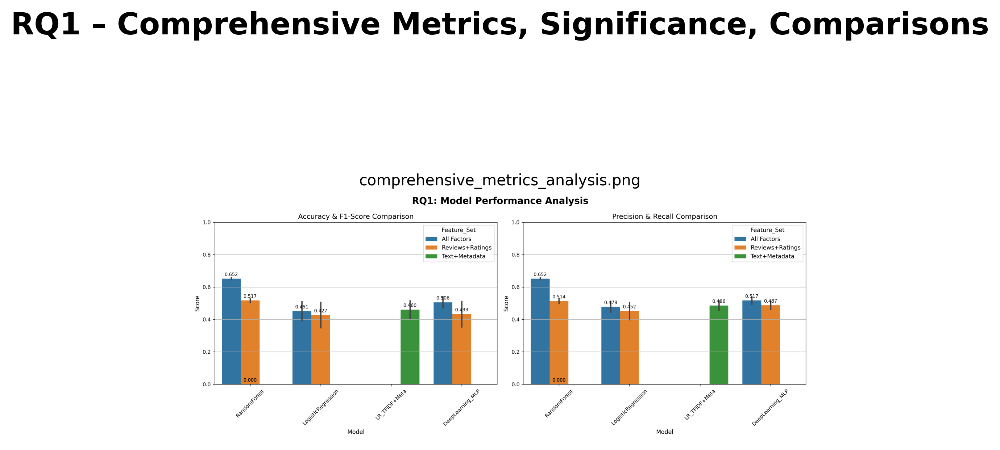

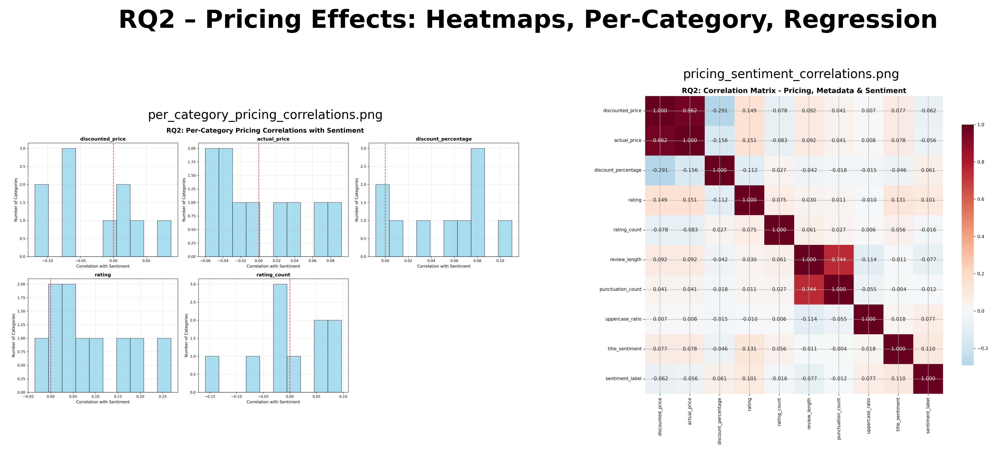

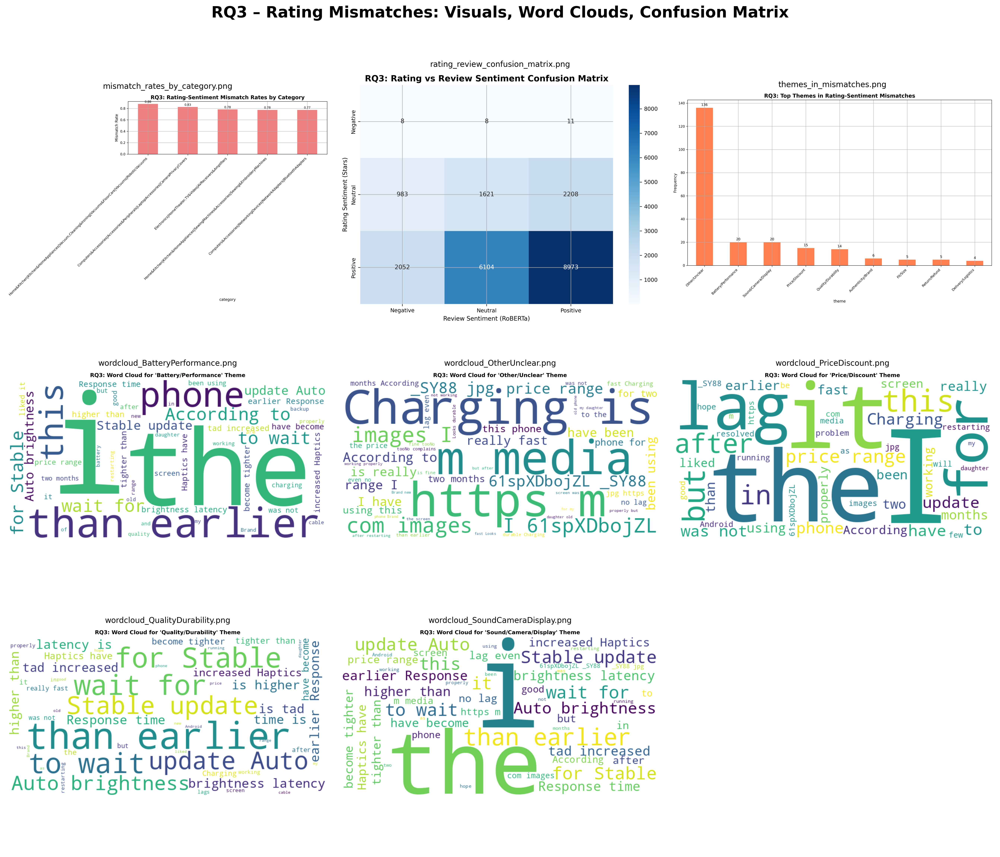

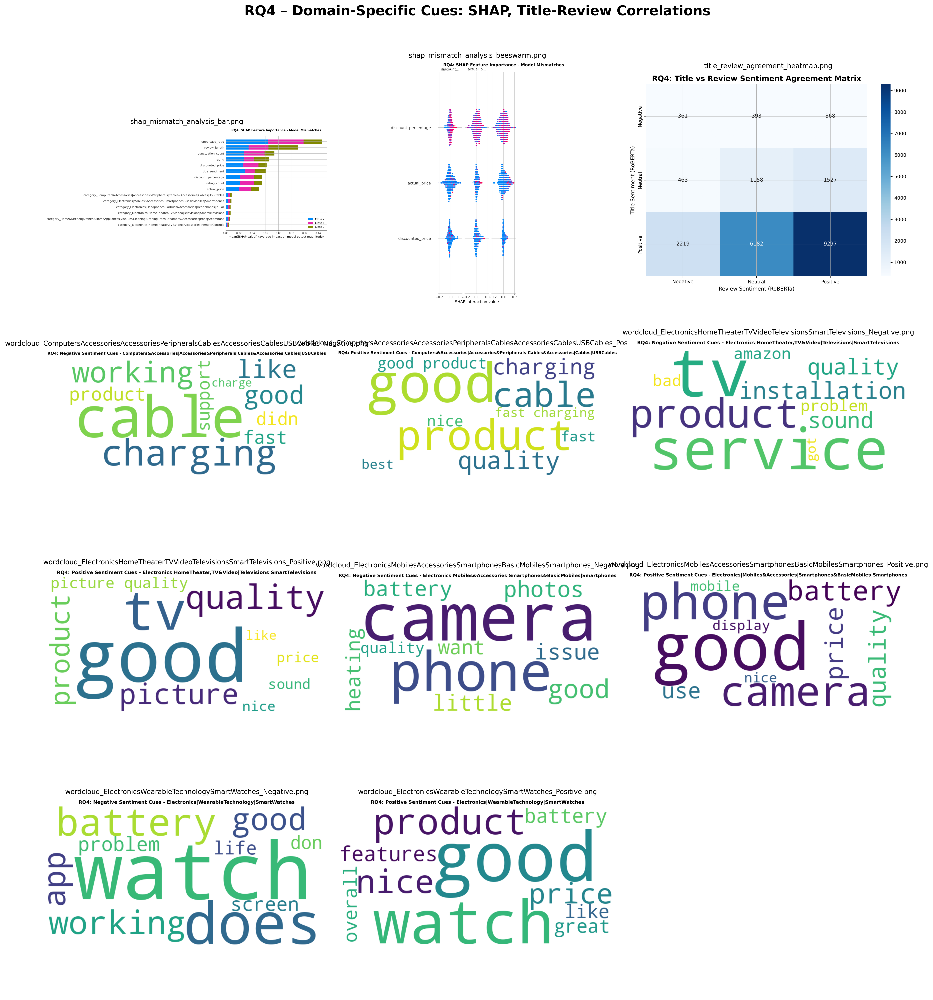

In [ ]:
# =====================================================
# QUESTION-WISE DASHBOARDS
# =====================================================

import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os
import math

def create_dashboard(image_dir, rq_title, save_path=None):
    """
    Assemble all .png images in a directory into a single clean dashboard.
    """
    # Collect images
    images = [os.path.join(image_dir, f) for f in os.listdir(image_dir) if f.endswith(".png")]
    images.sort()  # ensure consistent order

    if not images:
        print(f"No images found in {image_dir}")
        return

    n = len(images)
    cols = 3 if n > 2 else n  # 3 columns for balance
    rows = math.ceil(n / cols)

    fig, axes = plt.subplots(rows, cols, figsize=(cols*6, rows*5))
    fig.suptitle(rq_title, fontsize=20, fontweight="bold", y=1.02)

    # Flatten axes for easy indexing
    if rows == 1 and cols == 1:
        axes = [axes]
    else:
        axes = axes.flatten()

    # Plot each image
    for ax, img_path in zip(axes, images):
        img = mpimg.imread(img_path)
        ax.imshow(img)
        ax.axis("off")
        ax.set_title(os.path.basename(img_path), fontsize=10, pad=5)

    # Hide any unused subplots
    for ax in axes[len(images):]:
        ax.axis("off")

    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches="tight")
    plt.show()


# ==== Generate Dashboards for Each RQ ====

create_dashboard(RQ_DIRS["RQ1"], "RQ1 – Comprehensive Metrics, Significance, Comparisons",
                 save_path=os.path.join(BASE_OUTPUT_DIR, "RQ1_dashboard.png"))

create_dashboard(RQ_DIRS["RQ2"], "RQ2 – Pricing Effects: Heatmaps, Per-Category, Regression",
                 save_path=os.path.join(BASE_OUTPUT_DIR, "RQ2_dashboard.png"))

create_dashboard(RQ_DIRS["RQ3"], "RQ3 – Rating Mismatches: Visuals, Word Clouds, Confusion Matrix",
                 save_path=os.path.join(BASE_OUTPUT_DIR, "RQ3_dashboard.png"))

create_dashboard(RQ_DIRS["RQ4"], "RQ4 – Domain-Specific Cues: SHAP, Title-Review Correlations",
                 save_path=os.path.join(BASE_OUTPUT_DIR, "RQ4_dashboard.png"))
